In [1]:
from pdf2image import convert_from_path


In [2]:
pages = convert_from_path('/home/vimalkumar.s/Downloads/01.pdf', 500)


In [3]:
x = []
for page in pages:
    #page.save('out.jpg', 'JPEG')
    x.append(page)

In [4]:
x

[<PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=4182x5444 at 0x7F6B44223160>,
 <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=4121x5393 at 0x7F6B442234F0>,
 <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=4078x5377 at 0x7F6B44208220>,
 <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=4077x5378 at 0x7F6B44215550>,
 <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=4077x5378 at 0x7F6B442156D0>,
 <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=4102x5402 at 0x7F6B44215760>,
 <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=4098x5388 at 0x7F6B44215790>]

In [5]:
x[1].save('/home/vimalkumar.s/Documents/table splitting/page_2/file/pg_2.jpeg', 'JPEG',quality = 99)

In [1]:
    import matplotlib.image as mpimg
    import matplotlib.pyplot as plt
    from PIL import Image
    from fuzzywuzzy import fuzz
    from fuzzywuzzy import process
    import cv2
    import os
    import math
    import sys
    import numpy as np
    import pytesseract
    import io 
    import csv
    import pandas as pd
    import shutil, os
    import warnings
    warnings.filterwarnings('ignore')

/home/vimalkumar.s/Documents/python_new/cde_venv/lib/python3.8/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [125]:
    import matplotlib.image as mpimg
    import matplotlib.pyplot as plt
    from PIL import Image
    from fuzzywuzzy import fuzz
    from fuzzywuzzy import process
    import cv2
    import os
    import math
    import sys
    import numpy as np
    import pytesseract
    import io 
    import csv
    import pandas as pd
    import shutil, os
    import warnings
    warnings.filterwarnings('ignore')
    def extract_cell_images_from_table(image):
        BLUR_KERNEL_SIZE = (17, 17)
        STD_DEV_X_DIRECTION = 0
        STD_DEV_Y_DIRECTION = 0
        blurred = cv2.GaussianBlur(image, BLUR_KERNEL_SIZE, STD_DEV_X_DIRECTION, STD_DEV_Y_DIRECTION)
        MAX_COLOR_VAL = 255
        BLOCK_SIZE = 15
        SUBTRACT_FROM_MEAN = -2

        img_bin = cv2.adaptiveThreshold(
            ~blurred,
            MAX_COLOR_VAL,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY,
            BLOCK_SIZE,
            SUBTRACT_FROM_MEAN,
        )
        vertical = horizontal = img_bin.copy()
        SCALE = 5
        image_width, image_height = horizontal.shape
        horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(image_width / SCALE), 1))
        horizontally_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, horizontal_kernel)
        vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(image_height / SCALE)))
        vertically_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, vertical_kernel)

        horizontally_dilated = cv2.dilate(horizontally_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1)))
        vertically_dilated = cv2.dilate(vertically_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 60)))

        mask = horizontally_dilated + vertically_dilated
        contours, heirarchy = cv2.findContours(
            mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE,
        )

        perimeter_lengths = [cv2.arcLength(c, True) for c in contours]
        epsilons = [0.05 * p for p in perimeter_lengths]
        approx_polys = [cv2.approxPolyDP(c, e, True) for c, e in zip(contours, epsilons)]

        # Filter out contours that aren't rectangular. Those that aren't rectangular
        # are probably noise.
        approx_rects = [p for p in approx_polys if len(p) == 4]
        bounding_rects = [cv2.boundingRect(a) for a in approx_polys]

        # Filter out rectangles that are too narrow or too short.
        MIN_RECT_WIDTH = 40
        MIN_RECT_HEIGHT = 10
        bounding_rects = [
            r for r in bounding_rects if MIN_RECT_WIDTH < r[2] and MIN_RECT_HEIGHT < r[3]
        ]

        # The largest bounding rectangle is assumed to be the entire table.
        # Remove it from the list. We don't want to accidentally try to OCR
        # the entire table.
        largest_rect = max(bounding_rects, key=lambda r: r[2] * r[3])
        bounding_rects = [b for b in bounding_rects if b is not largest_rect]

        cells = [c for c in bounding_rects]
        def cell_in_same_row(c1, c2):
            c1_center = c1[1] + c1[3] - c1[3] / 2
            c2_bottom = c2[1] + c2[3]
            c2_top = c2[1]
            return c2_top < c1_center < c2_bottom

        orig_cells = [c for c in cells]
        rows = []
        while cells:
            first = cells[0]
            rest = cells[1:]
            cells_in_same_row = sorted(
                [
                    c for c in rest
                    if cell_in_same_row(c, first)
                ],
                key=lambda c: c[0]
            )

            row_cells = sorted([first] + cells_in_same_row, key=lambda c: c[0])
            rows.append(row_cells)
            cells = [
                c for c in rest
                if not cell_in_same_row(c, first)
            ]

        # Sort rows by average height of their center.
        def avg_height_of_center(row):
            centers = [y + h - h / 2 for x, y, w, h in row]
            return sum(centers) / len(centers)

        rows.sort(key=avg_height_of_center)
        cell_images_rows = []
        for row in rows:
            cell_images_row = []
            for x, y, w, h in row:
                cell_images_row.append(image[y:y+h, x:x+w])
            cell_images_rows.append(cell_images_row)
        return cell_images_rows

    def main(f):
        results = []
        directory, filename = os.path.split(f)
        table = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        rows = extract_cell_images_from_table(table)
        #cell_img_dir = os.path.join(directory, "cells")
        #os.makedirs(cell_img_dir, exist_ok=True)
        out_path = os.path.join('/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells')
        paths = []
        for i, row in enumerate(rows):
            for j, cell in enumerate(row):
                cell_filename = "{:03d}-{:03d}.png".format(i, j)
                path = os.path.join(out_path, cell_filename)
                cv2.imwrite(path, cell)
                paths.append(path)
        return paths
    f = '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract/pg_4/table-000.png'
    main(f)

['/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/000-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/000-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/000-002.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/001-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/001-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/001-002.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/002-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/002-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/002-002.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/003-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells/003-001.png',
 '/home/vimalkumar.s/Documents/t

In [42]:
import os
def find_tables(image):
    BLUR_KERNEL_SIZE = (17, 17)
    STD_DEV_X_DIRECTION = 0
    STD_DEV_Y_DIRECTION = 0
    blurred = cv2.GaussianBlur(image, BLUR_KERNEL_SIZE, STD_DEV_X_DIRECTION, STD_DEV_Y_DIRECTION)
    MAX_COLOR_VAL = 255
    BLOCK_SIZE = 15
    SUBTRACT_FROM_MEAN = -2
    
    img_bin = cv2.adaptiveThreshold(
        ~blurred,
        MAX_COLOR_VAL,
        cv2.ADAPTIVE_THRESH_MEAN_C,
        cv2.THRESH_BINARY,
        BLOCK_SIZE,
        SUBTRACT_FROM_MEAN,
    )
    vertical = horizontal = img_bin.copy()
    SCALE = 5
    image_width, image_height = horizontal.shape
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(image_width / SCALE), 1))
    horizontally_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, horizontal_kernel)
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(image_height / SCALE)))
    vertically_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, vertical_kernel)
    
    horizontally_dilated = cv2.dilate(horizontally_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1)))
    vertically_dilated = cv2.dilate(vertically_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 60)))
    
    mask = horizontally_dilated + vertically_dilated
    contours, heirarchy = cv2.findContours(
        mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE,
    )

    MIN_TABLE_AREA = 1e5
    contours = [c for c in contours if cv2.contourArea(c) > MIN_TABLE_AREA]
    perimeter_lengths = [cv2.arcLength(c, True) for c in contours]
    epsilons = [0.1 * p for p in perimeter_lengths]
    approx_polys = [cv2.approxPolyDP(c, e, True) for c, e in zip(contours, epsilons)]
    bounding_rects = [cv2.boundingRect(a) for a in approx_polys]

    # The link where a lot of this code was borrowed from recommends an
    # additional step to check the number of "joints" inside this bounding rectangle.
    # A table should have a lot of intersections. We might have a rectangular image
    # here though which would only have 4 intersections, 1 at each corner.
    # Leaving that step as a future TODO if it is ever necessary.
    images = [image[y:y+h, x:x+w] for x, y, w, h in bounding_rects]
    return images

def main(files):
    file_path = '/home/vimalkumar.s/Documents/table splitting/page_5'
    files = os.listdir(file_path)
    results = []
    for f in files:
        directory, filename = os.path.split(f)
        #image = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        image = cv2.imread(os.path.join(file_path,f),0)
        tables = find_tables(image)
        files = []
        filename_sans_extension = os.path.splitext(filename)[0]
        if tables:
            os.makedirs(os.path.join(directory, filename_sans_extension), exist_ok=True)
        for i, table in enumerate(tables):
            table_filename = "table-{:03d}.png".format(i)
            table_filepath = os.path.join(
                directory, filename_sans_extension, table_filename
            )
            files.append(table_filepath)
            cv2.imwrite(table_filepath, table)
        if tables:
            results.append((f, files))
    # Results is [[<input image>, [<images of detected tables>]]]
    return results

In [43]:
file_path = '/home/vimalkumar.s/Documents/table splitting/page_5'
files = os.listdir(file_path)

In [44]:
main(files)

[]

In [136]:
import pytesseract

In [47]:
x = pytesseract.image_to_string("/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg")

In [48]:
print(x)

SOUTHEAST DEALER

Sea nacre nar ga

    
   
   
  
   
  
 
  
   

      

         
  

   
     
  
   
   
    
   
     
     
  
   
 
    

57,000 24-Aug-92 D32 CV 00345

1269 S JOSEPHINE ST DENV 561,950

TYRES znRi 3 =SubBONNIE BRAE Br2 Ba2 Sq614

Ln0 LorS0X125 €E Mb10X10 U:

Ty 0.00 & BatF Acer Pr22X10 M:7 1 614
$ 0 FintP95 Fpl 1 wurt5X11 L:

Tx 666 PlinN GarG,D 2 HtG.,HW pbr1i1X8 B:1 T

MIP N ¥r SwrPUB wWerPUB xr10X8 cstBR Sty R

Trm CV,CA Ss 2.80 B 2.80 ER

38,900 09-Sep-82 pb 161 O 24-Aug-92 p54 F
1246 N TRENTON ST DENV $38,900 967 S LOCUST ST DENV 552,500

TyRES znR1 8 sSubKENSINGTON Br2 Bal Sq700| TyRES2nA-1 SubSUN VALLEY Br2 Bal Sq 836
Lo Lot 6500 Ww Mb11X10 vu: Ln45,000 LotS0X125 E MbOxXO 8oU:
Ty 0.00 & Bst C Acr FrOXO mM:2 FULL 700} TyCV 10.12% Bst S Acr PrOxO M:2 F 836

$ 0 Fint Fp Lri6X11 L: PIT! $470 F Fint Fp LrOXO iL:
Tx 493 FlInN GarG,A 1 HtG,FA prOX0_ 2B: T 511 FlinN Gar HctG,FA prOXO~ 2B:
MIP N yr1941 SwrPUB werPUB xc13X11 cetFR Sty A | MIP N yr1955 SwrPUB wer

In [66]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read image 
# Convert the image to gray-scale
img = cv2.imread('/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg', cv2.IMREAD_COLOR)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Find the edges in the image using canny detector
edges = cv2.Canny(gray, 20, 1000)
# Detect points that form a line
#lines = cv2.HoughLinesP(edges, 1, np.pi/180, 2, minLineLength=5, maxLineGap=100)
lines = cv2.HoughLinesP(edges, 1, np.pi/20, 400, minLineLength=200, maxLineGap=800)
# Draw lines on the image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(img, (x1, y1), (x2, y2), (255, 0, 0), 1)
# Show result
#cv2.imwrite("Result Image.jpg", img)
plt.figure(figsize=(20,20))
plt.imshow(img)

TypeError: 'NoneType' object is not iterable

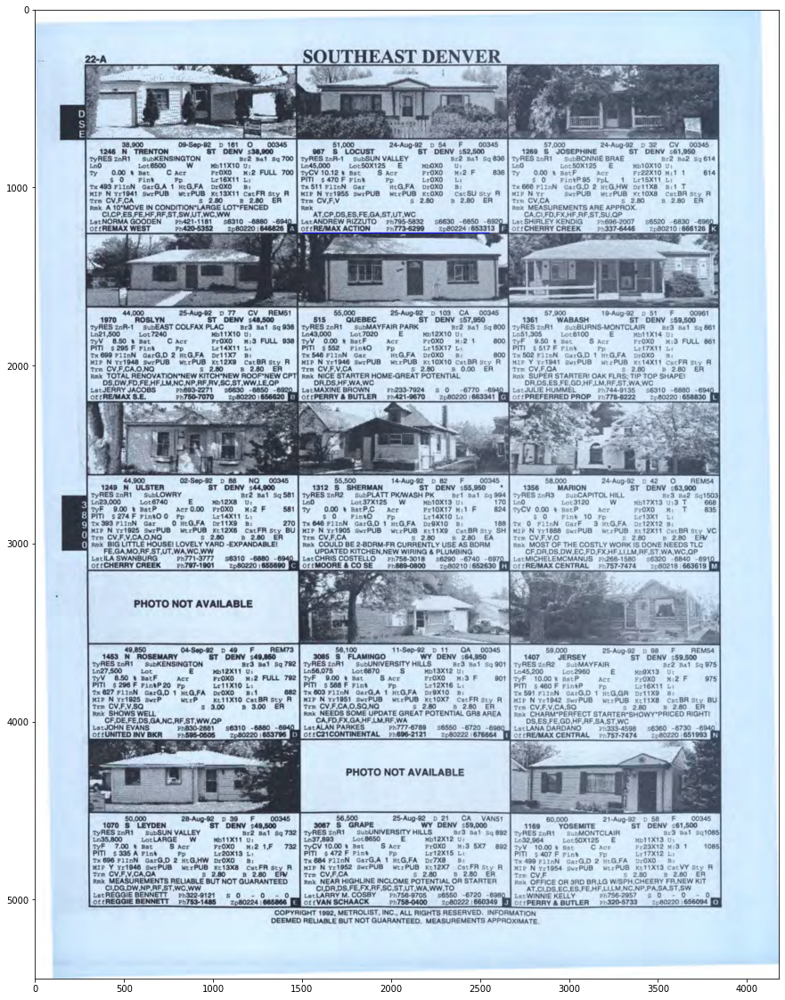

In [69]:
img = cv2.imread("/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 20, 200)
lines = cv2.HoughLinesP(edges, 1, math.pi/2, 2, None, 30, 1);
for line in lines[0]:
    pt1 = (line[0],line[1])
    pt2 = (line[2],line[3])
    cv2.line(img, pt1, pt2, (0,0,255), 3)
plt.figure(figsize=(20,20))
plt.imshow(img)

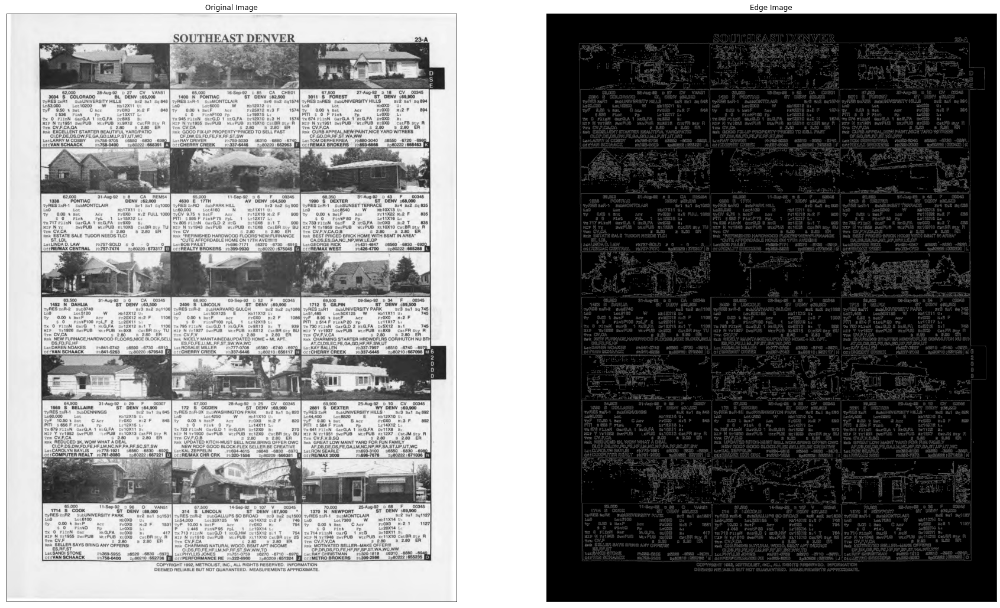

In [74]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread('/home/vimalkumar.s/Documents/table splitting/page_2/file/pg_2.jpeg',0)
edges = cv.Canny(img,100,200)
plt.figure(figsize=(30,30))
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
    import matplotlib.image as mpimg
    import matplotlib.pyplot as plt
    from PIL import Image
    from fuzzywuzzy import fuzz
    from fuzzywuzzy import process
    import cv2
    import os
    import math
    import sys
    import numpy as np
    import pytesseract
    import io 
    import csv
    import pandas as pd
    import shutil, os
    import warnings
    warnings.filterwarnings('ignore')
    def extract_cell_images_from_table(image):
        BLUR_KERNEL_SIZE = (17, 17)
        STD_DEV_X_DIRECTION = 0
        STD_DEV_Y_DIRECTION = 0
        blurred = cv2.GaussianBlur(image, BLUR_KERNEL_SIZE, STD_DEV_X_DIRECTION, STD_DEV_Y_DIRECTION)
        MAX_COLOR_VAL = 255
        BLOCK_SIZE = 15
        SUBTRACT_FROM_MEAN = -2

        img_bin = cv2.adaptiveThreshold(
            ~blurred,
            MAX_COLOR_VAL,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY,
            BLOCK_SIZE,
            SUBTRACT_FROM_MEAN,
        )
        vertical = horizontal = img_bin.copy()
        SCALE = 5
        image_width, image_height = horizontal.shape
        horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(image_width / SCALE), 1))
        horizontally_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, horizontal_kernel)
        vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(image_height / SCALE)))
        vertically_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, vertical_kernel)

        horizontally_dilated = cv2.dilate(horizontally_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1)))
        vertically_dilated = cv2.dilate(vertically_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 60)))

        mask = horizontally_dilated + vertically_dilated
        contours, heirarchy = cv2.findContours(
            mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE,
        )

        perimeter_lengths = [cv2.arcLength(c, True) for c in contours]
        epsilons = [0.05 * p for p in perimeter_lengths]
        approx_polys = [cv2.approxPolyDP(c, e, True) for c, e in zip(contours, epsilons)]

        # Filter out contours that aren't rectangular. Those that aren't rectangular
        # are probably noise.
        approx_rects = [p for p in approx_polys if len(p) == 4]
        bounding_rects = [cv2.boundingRect(a) for a in approx_polys]

        # Filter out rectangles that are too narrow or too short.
        MIN_RECT_WIDTH = 40
        MIN_RECT_HEIGHT = 10
        bounding_rects = [
            r for r in bounding_rects if MIN_RECT_WIDTH < r[2] and MIN_RECT_HEIGHT < r[3]
        ]

        # The largest bounding rectangle is assumed to be the entire table.
        # Remove it from the list. We don't want to accidentally try to OCR
        # the entire table.
        largest_rect = max(bounding_rects, key=lambda r: r[2] * r[3])
        bounding_rects = [b for b in bounding_rects if b is not largest_rect]

        cells = [c for c in bounding_rects]
        def cell_in_same_row(c1, c2):
            c1_center = c1[1] + c1[3] - c1[3] / 2
            c2_bottom = c2[1] + c2[3]
            c2_top = c2[1]
            return c2_top < c1_center < c2_bottom

        orig_cells = [c for c in cells]
        rows = []
        while cells:
            first = cells[0]
            rest = cells[1:]
            cells_in_same_row = sorted(
                [
                    c for c in rest
                    if cell_in_same_row(c, first)
                ],
                key=lambda c: c[0]
            )

            row_cells = sorted([first] + cells_in_same_row, key=lambda c: c[0])
            rows.append(row_cells)
            cells = [
                c for c in rest
                if not cell_in_same_row(c, first)
            ]

        # Sort rows by average height of their center.
        def avg_height_of_center(row):
            centers = [y + h - h / 2 for x, y, w, h in row]
            return sum(centers) / len(centers)

        rows.sort(key=avg_height_of_center)
        cell_images_rows = []
        for row in rows:
            cell_images_row = []
            for x, y, w, h in row:
                cell_images_row.append(image[y:y+h, x:x+w])
            cell_images_rows.append(cell_images_row)
        return cell_images_rows

    def main(f):
        results = []
        directory, filename = os.path.split(f)
        table = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        rows = extract_cell_images_from_table(table)
        #cell_img_dir = os.path.join(directory, "cells")
        #os.makedirs(cell_img_dir, exist_ok=True)
        out_path = os.path.join('/home/vimalkumar.s/Documents/table splitting/page_4/table_extract_cells')
        paths = []
        for i, row in enumerate(rows):
            for j, cell in enumerate(row):
                cell_filename = "{:03d}-{:03d}.png".format(i, j)
                path = os.path.join(out_path, cell_filename)
                cv2.imwrite(path, cell)
                paths.append(path)
        return paths
    f = '/home/vimalkumar.s/Documents/table splitting/page_4/table_extract/pg_4/table-000.png'
    main(f)

In [80]:
import numpy
import matplotlib.pyplot as plt
import cv2

In [82]:
file_grey = cv2.imread("/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg",0)

In [83]:
file = cv2.imread("/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg")

In [84]:
file_grey.min()

9

In [85]:
file_grey.max()

255

In [86]:
ret,thresh_value = cv2.threshold(file_grey,9,255,cv2.THRESH_BINARY_INV)

In [88]:
kernel = np.ones((5,5),np.uint8)
dilated_val = cv2.dilate(thresh_value,kernel,iterations = 1)

In [89]:
contours,hierrachy = cv2.findContours(dilated_val,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

In [93]:
%matplotlib qt

ImportError: Failed to import any qt binding

In [96]:
coordinates = []
for contour in contours:
    x,y,w,h = cv2.boundingRect(contour)
    coordinates.append((x,y,w,h))
    if y < 200:
        cv2.rectangle(file,(x,y),(x+w,y+h),(0,0,255),1)

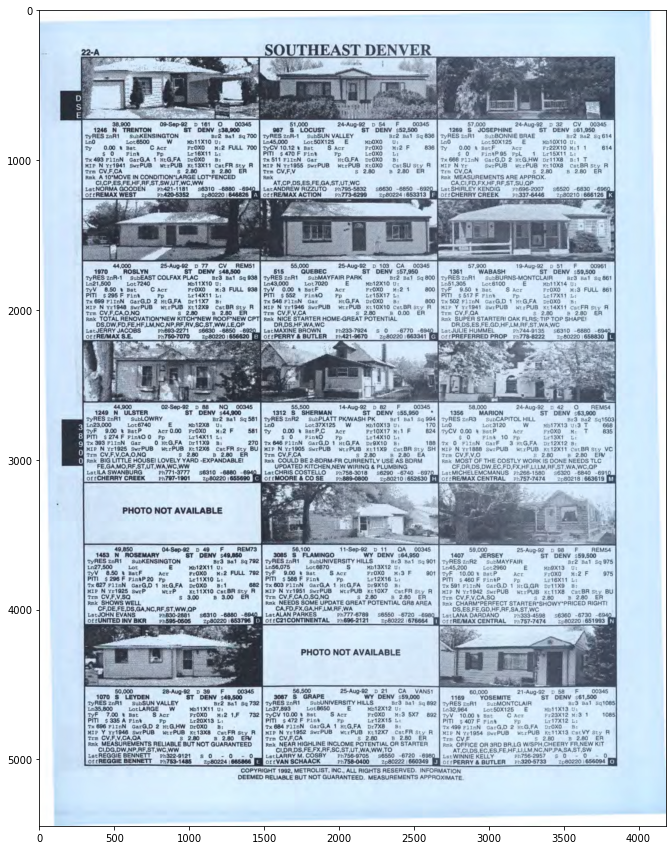

In [97]:
plt.figure(figsize=(15,15))
plt.imshow(file)

In [98]:
file_grey.shape

(5444, 4182)

In [113]:
tmp = np.where(file_grey > 200 , file_grey , 0)

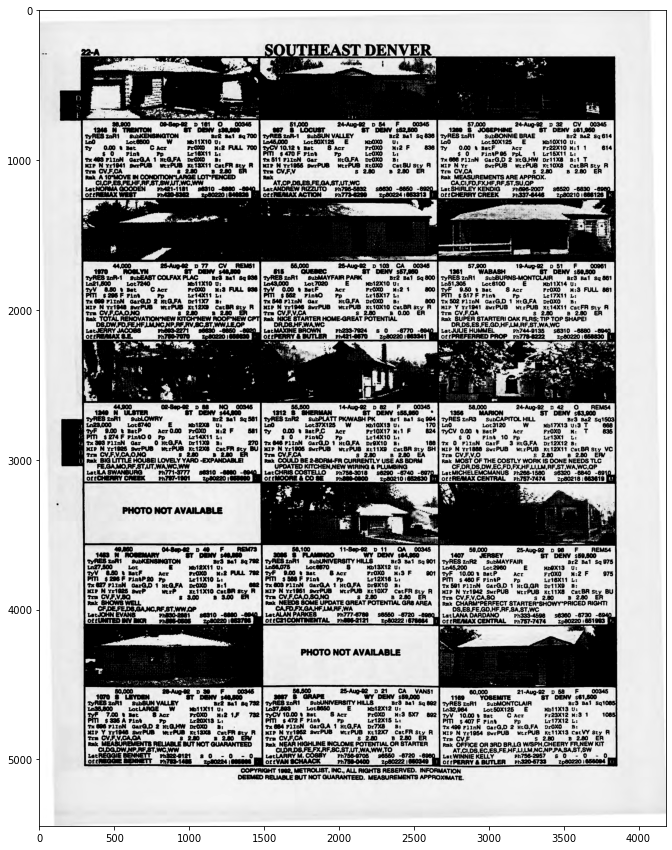

In [114]:
plt.figure(figsize=(15,15))

plt.imshow(tmp,cmap = 'gray')

In [9]:
    import matplotlib.image as mpimg
    import matplotlib.pyplot as plt
    from PIL import Image
    from fuzzywuzzy import fuzz
    from fuzzywuzzy import process
    import cv2
    import os
    import math
    import sys
    import numpy as np
    import pytesseract
    import io 
    import csv
    import pandas as pd
    import shutil, os
    import warnings
    warnings.filterwarnings('ignore')
    def extract_cell_images_from_table(image):
        BLUR_KERNEL_SIZE = (17,17)
        STD_DEV_X_DIRECTION = 0
        STD_DEV_Y_DIRECTION = 0
        blurred = cv2.GaussianBlur(image, BLUR_KERNEL_SIZE, STD_DEV_X_DIRECTION, STD_DEV_Y_DIRECTION)
        MAX_COLOR_VAL = 255
        BLOCK_SIZE = 15
        SUBTRACT_FROM_MEAN = -2

        img_bin = cv2.adaptiveThreshold(
            ~blurred,
            MAX_COLOR_VAL,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY,
            BLOCK_SIZE,
            SUBTRACT_FROM_MEAN,
        )
        vertical = horizontal = img_bin.copy()
        SCALE = 5
        image_width, image_height = horizontal.shape
        horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(image_width / SCALE), 1))
        horizontally_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, horizontal_kernel)
        vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(image_height / SCALE)))
        vertically_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, vertical_kernel)

        horizontally_dilated = cv2.dilate(horizontally_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (100, 1)))
        vertically_dilated = cv2.dilate(vertically_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 100)))

        mask = horizontally_dilated + vertically_dilated
        contours, heirarchy = cv2.findContours(
            mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE,
        )

        perimeter_lengths = [cv2.arcLength(c, True) for c in contours]
        epsilons = [0.05 * p for p in perimeter_lengths]
        approx_polys = [cv2.approxPolyDP(c, e, True) for c, e in zip(contours, epsilons)]

        # Filter out contours that aren't rectangular. Those that aren't rectangular
        # are probably noise.
        approx_rects = [p for p in approx_polys if len(p) == 4]
        bounding_rects = [cv2.boundingRect(a) for a in approx_polys]

        # Filter out rectangles that are too narrow or too short.
        MIN_RECT_WIDTH = 40
        MIN_RECT_HEIGHT = 10
        bounding_rects = [
            r for r in bounding_rects if MIN_RECT_WIDTH < r[2] and MIN_RECT_HEIGHT < r[3]
        ]

        # The largest bounding rectangle is assumed to be the entire table.
        # Remove it from the list. We don't want to accidentally try to OCR
        # the entire table.
        largest_rect = max(bounding_rects, key=lambda r: r[2] * r[3])
        bounding_rects = [b for b in bounding_rects if b is not largest_rect]

        cells = [c for c in bounding_rects]
        def cell_in_same_row(c1, c2):
            c1_center = c1[1] + c1[3] - c1[3] / 2
            c2_bottom = c2[1] + c2[3]
            c2_top = c2[1]
            return c2_top < c1_center < c2_bottom

        orig_cells = [c for c in cells]
        rows = []
        while cells:
            first = cells[0]
            rest = cells[1:]
            cells_in_same_row = sorted(
                [
                    c for c in rest
                    if cell_in_same_row(c, first)
                ],
                key=lambda c: c[0]
            )

            row_cells = sorted([first] + cells_in_same_row, key=lambda c: c[0])
            rows.append(row_cells)
            cells = [
                c for c in rest
                if not cell_in_same_row(c, first)
            ]

        # Sort rows by average height of their center.
        def avg_height_of_center(row):
            centers = [y + h - h / 2 for x, y, w, h in row]
            return sum(centers) / len(centers)

        rows.sort(key=avg_height_of_center)
        cell_images_rows = []
        for row in rows:
            cell_images_row = []
            for x, y, w, h in row:
                cell_images_row.append(image[y:y+h, x:x+w])
            cell_images_rows.append(cell_images_row)
        return cell_images_rows

    def main(f):
        results = []
        directory, filename = os.path.split(f)
        table = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        rows = extract_cell_images_from_table(table)
        #cell_img_dir = os.path.join(directory, "cells")
        #os.makedirs(cell_img_dir, exist_ok=True)
        out_path = os.path.join('/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3')
        paths = []
        for i, row in enumerate(rows):
            for j, cell in enumerate(row):
                cell_filename = "{:03d}-{:03d}.png".format(i, j)
                path = os.path.join(out_path, cell_filename)
                cv2.imwrite(path, cell)
                paths.append(path)
        return paths
    f = '/home/vimalkumar.s/Documents/table splitting/page_3/table_extract/pg_3/table-000.png'
    main(f)

['/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/000-000.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/000-001.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/001-000.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/001-001.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/001-002.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/002-000.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/003-000.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/003-001.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/003-002.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/004-000.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/004-001.png',
 '/home/vimalkumar.s/Documents/table splitting/sample/cells/pg_3/004-002.png',
 '/home/vimalkumar.s/Documents/table splitting/sampl

In [149]:
x = pytesseract.image_to_string('/home/vimalkumar.s/Documents/table splitting/cells/splitted_cells/001-000.png',lang = 'eng')

In [150]:
print(x)

 

38,900 09-Sep-92 bp 161 O 00345

1246 N TRENTON ST DENV s38,900
TyRES znR1 8 subKENSINGTON Br2 Bal Sq 700
Lad Lot 6500 Ww Mb11X10 vu:

Ty 0.00 & Bat C acr FrOXO wm:2 FULL 700
$ 0 Fint Fp Lri6X11 L:

Tx 493 FlInN GarG,A 1 HtG,FA pbrOX0_ 2B:

MIP N yr1941 SwrPUB wrrPUB me CstFR Sty A

trm CV,F,CA Ss 2.80 B 2.80

rmk A 10*MOVE IN Oe sem uTwe wn LOT*FENCED
CI,CP,ES,FE,HF,AF,ST,SW,UT,WC

LatNORMA GOODEN ph421-1181- waesi0 -6880 -

orffREMAX WEST pPn420-5352 2p80220 | 646826



In [1]:
import cv2
import numpy as np
import easyocr
from PIL import Image
import warnings
warnings.filterwarnings("ignore")

reader = easyocr.Reader(['en'],gpu = False)
image = cv2.imread('/home/vimalkumar.s/Documents/table splitting/cells/splitted_cells/001-000.png')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpen = cv2.filter2D(gray, -1, sharpen_kernel)
thresh = cv2.threshold(sharpen, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
r_easy_ocr=reader.readtext(thresh,detail=0)
print(r_easy_ocr)

Using CPU. Note: This module is much faster with a GPU.


['38,900', '08-S0p-82', 'D 161', '00345', '1246', 'N', 'TrENTON', '8T', 'DENV 538,800', 'TyaES zna1', 'SubKENSINGTON', 'Dr?', 'Ba 1', 'sq 700', 'Lno', 'Locosoo', 'miiX1O', '0:', 'Ty', '0.0', 'Bar', 'Acr', 'FroXo', 'M:2 FULL', '7000', '0', 'Ping', 'Lr16X11', 'L}', 'Tx 493 FIInN', 'GarGA', '1', 'XtG,FA', 'DrOXO', '8 :', 'WIP', 'N Yr19a1', 'swrPUB', 'WtrPUB', 'Xe 13X11 CetFA sty A', 'Trm CV,F,CA', '5', '2.,8', '8', '2,80', 'ea', 'Rmk', "A 10*MOVE IN CONDITION' LAAGE LOT FENCED", 'CI,CP ES, FE HF AF ST,SW UT,WC, WW', 'LatNORMA GOODEN', 'Ph*21-1181', '56310', '~8800', '-6940', 'OE{REMAX WeST', 'Ph420-5352', '2p80220 1646826']


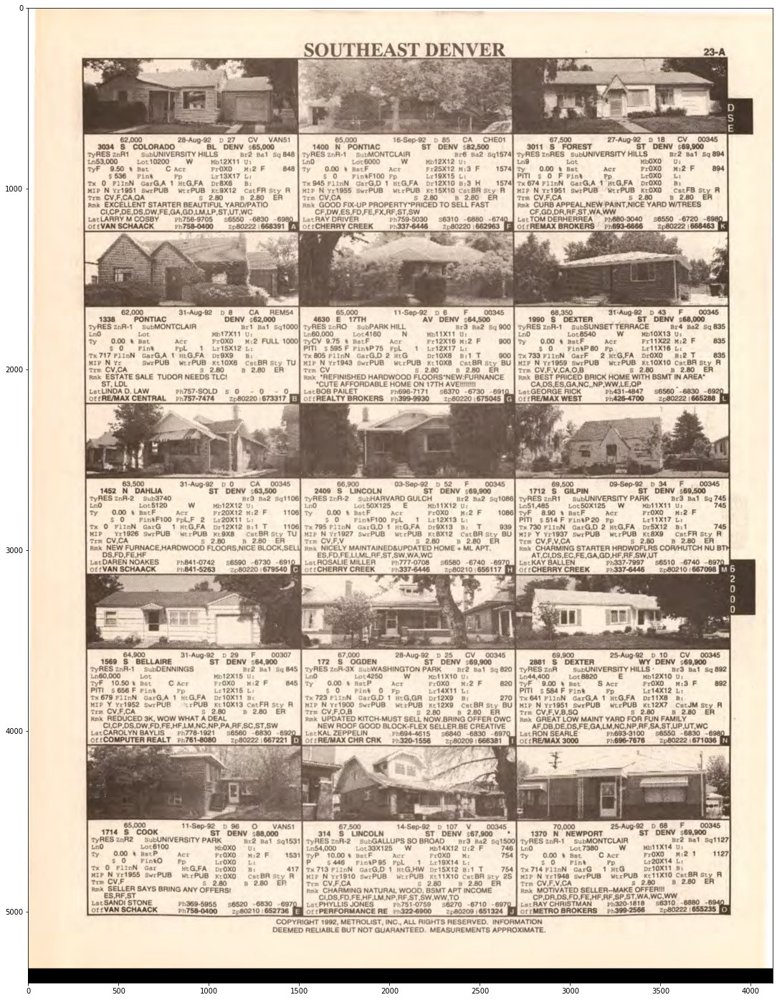

In [24]:

import matplotlib.pyplot as plt
from PIL import Image

img = Image.open('/home/vimalkumar.s/Documents/table splitting/page_2/file/pg_2.jpeg')

for x in range(img.width):
    for y in range(img.height - 80, img.height):
        img.putpixel((x, y), (0, 0, 0))
img.save('/home/vimalkumar.s/Documents/table splitting/sample/file/sample_2.jpeg')
plt.figure(figsize=(25,25))

plt.imshow(img)

In [25]:
import os
def find_tables(image):
    BLUR_KERNEL_SIZE = (17, 17)
    STD_DEV_X_DIRECTION = 0
    STD_DEV_Y_DIRECTION = 0
    blurred = cv2.GaussianBlur(image, BLUR_KERNEL_SIZE, STD_DEV_X_DIRECTION, STD_DEV_Y_DIRECTION)
    MAX_COLOR_VAL = 255
    BLOCK_SIZE = 15
    SUBTRACT_FROM_MEAN = -2
    
    img_bin = cv2.adaptiveThreshold(
        ~blurred,
        MAX_COLOR_VAL,
        cv2.ADAPTIVE_THRESH_MEAN_C,
        cv2.THRESH_BINARY,
        BLOCK_SIZE,
        SUBTRACT_FROM_MEAN,
    )
    vertical = horizontal = img_bin.copy()
    SCALE = 5
    image_width, image_height = horizontal.shape
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(image_width / SCALE), 1))
    horizontally_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, horizontal_kernel)
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(image_height / SCALE)))
    vertically_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, vertical_kernel)
    
    horizontally_dilated = cv2.dilate(horizontally_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1)))
    vertically_dilated = cv2.dilate(vertically_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 60)))
    
    mask = horizontally_dilated + vertically_dilated
    contours, heirarchy = cv2.findContours(
        mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE,
    )

    MIN_TABLE_AREA = 1e5
    contours = [c for c in contours if cv2.contourArea(c) > MIN_TABLE_AREA]
    perimeter_lengths = [cv2.arcLength(c, True) for c in contours]
    epsilons = [0.1 * p for p in perimeter_lengths]
    approx_polys = [cv2.approxPolyDP(c, e, True) for c, e in zip(contours, epsilons)]
    bounding_rects = [cv2.boundingRect(a) for a in approx_polys]

    # The link where a lot of this code was borrowed from recommends an
    # additional step to check the number of "joints" inside this bounding rectangle.
    # A table should have a lot of intersections. We might have a rectangular image
    # here though which would only have 4 intersections, 1 at each corner.
    # Leaving that step as a future TODO if it is ever necessary.
    images = [image[y:y+h, x:x+w] for x, y, w, h in bounding_rects]
    return images

def main(files):
    file_path = '/home/vimalkumar.s/Documents/table splitting/sample/file'
    files = os.listdir(file_path)
    results = []
    for f in files:
        directory, filename = os.path.split(f)
        #image = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        image = cv2.imread(os.path.join(file_path,f),0)
        tables = find_tables(image)
        files = []
        filename_sans_extension = os.path.splitext(filename)[0]
        if tables:
            os.makedirs(os.path.join(directory, filename_sans_extension), exist_ok=True)
        for i, table in enumerate(tables):
            table_filename = "table-{:03d}.png".format(i)
            table_filepath = os.path.join(
                directory, filename_sans_extension, table_filename
            )
            files.append(table_filepath)
            cv2.imwrite(table_filepath, table)
        if tables:
            results.append((f, files))
    # Results is [[<input image>, [<images of detected tables>]]]
    return results

In [26]:
file_path = '/home/vimalkumar.s/Documents/table splitting/sample/file'
files = os.listdir(file_path)
main(files)

[('sample_4.jpeg', ['sample_4/table-000.png']),
 ('sample_1.jpeg', ['sample_1/table-000.png']),
 ('sample_2.jpeg', ['sample_2/table-000.png']),
 ('sample_3.jpeg', ['sample_3/table-000.png'])]

<class 'numpy.ndarray'>


['/home/vimalkumar.s/Documents/table splitting/page_1/test/1/000-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/000-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/001-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/001-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/001-002.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/002-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/003-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/003-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/004-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/004-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/005-000.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/005-001.png',
 '/home/vimalkumar.s/Documents/table splitting/page_1/test/1/005-002.png',
 '/home/vimalkumar.s/Docu

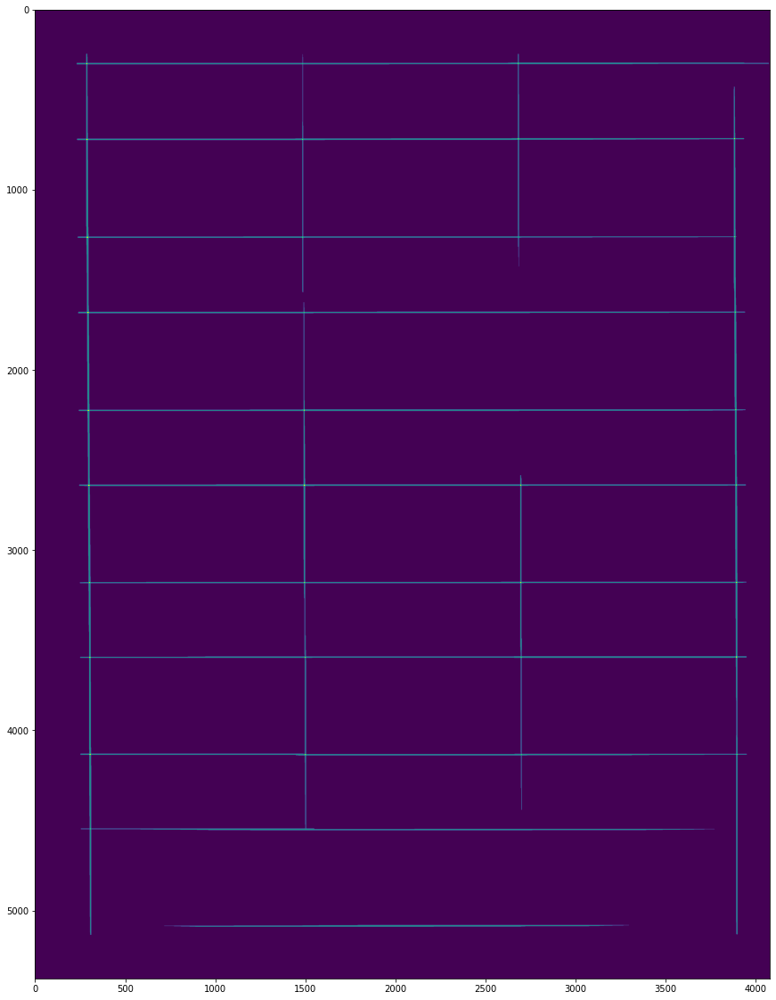

In [100]:
    import matplotlib.image as mpimg
    import matplotlib.pyplot as plt
    from PIL import Image
    from fuzzywuzzy import fuzz
    from fuzzywuzzy import process
    import cv2
    import os
    import math
    import sys
    import numpy as np
    import pytesseract
    import io 
    import csv
    import pandas as pd
    import shutil, os
    import warnings
    warnings.filterwarnings('ignore')
    def extract_cell_images_from_table(image):
        BLUR_KERNEL_SIZE = (17,17)
        STD_DEV_X_DIRECTION = 0
        STD_DEV_Y_DIRECTION = 0
        blurred = cv2.GaussianBlur(image, BLUR_KERNEL_SIZE, STD_DEV_X_DIRECTION, STD_DEV_Y_DIRECTION)
        MAX_COLOR_VAL = 8
        BLOCK_SIZE = 15
        SUBTRACT_FROM_MEAN = -2

        img_bin = cv2.adaptiveThreshold(
            ~blurred,
            MAX_COLOR_VAL,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY,
            BLOCK_SIZE,
            SUBTRACT_FROM_MEAN,
        )
        vertical = horizontal = img_bin.copy()
        SCALE = 5
        image_width, image_height = horizontal.shape
        horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(image_width / SCALE), 1))
        horizontally_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, horizontal_kernel)
        #plt.figure(figsize=(20,20))
        #plt.imshow(horizontally_opened)

        vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(image_height / SCALE)))
        vertically_opened = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, vertical_kernel)
        #plt.figure(figsize=(20,20))
        #plt.imshow(vertically_opened)
        horizontally_dilated = cv2.dilate(horizontally_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (100, 1)))
        vertically_dilated = cv2.dilate(vertically_opened, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 100)))

        mask = horizontally_dilated + vertically_dilated
        plt.figure(figsize=(20,20))
        sv = Image.fromarray(mask)
        sv.save('mask10.jpeg')
        plt.imshow(mask)
        print(type(mask))
        contours, heirarchy = cv2.findContours(
            mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE,
        )

        perimeter_lengths = [cv2.arcLength(c, True) for c in contours]
        epsilons = [0.05 * p for p in perimeter_lengths]
        approx_polys = [cv2.approxPolyDP(c, e, True) for c, e in zip(contours, epsilons)]

        # Filter out contours that aren't rectangular. Those that aren't rectangular
        # are probably noise.
        approx_rects = [p for p in approx_polys if len(p) == 4]
        bounding_rects = [cv2.boundingRect(a) for a in approx_polys]

        # Filter out rectangles that are too narrow or too short.
        MIN_RECT_WIDTH = 40
        MIN_RECT_HEIGHT = 10
        bounding_rects = [
            r for r in bounding_rects if MIN_RECT_WIDTH < r[2] and MIN_RECT_HEIGHT < r[3]
        ]

        # The largest bounding rectangle is assumed to be the entire table.
        # Remove it from the list. We don't want to accidentally try to OCR
        # the entire table.
        largest_rect = max(bounding_rects, key=lambda r: r[2] * r[3])
        bounding_rects = [b for b in bounding_rects if b is not largest_rect]

        cells = [c for c in bounding_rects]
        def cell_in_same_row(c1, c2):
            c1_center = c1[1] + c1[3] - c1[3] / 2
            c2_bottom = c2[1] + c2[3]
            c2_top = c2[1]
            return c2_top < c1_center < c2_bottom

        orig_cells = [c for c in cells]
        rows = []
        while cells:
            first = cells[0]
            rest = cells[1:]
            cells_in_same_row = sorted(
                [
                    c for c in rest
                    if cell_in_same_row(c, first)
                ],
                key=lambda c: c[0]
            )

            row_cells = sorted([first] + cells_in_same_row, key=lambda c: c[0])
            rows.append(row_cells)
            cells = [
                c for c in rest
                if not cell_in_same_row(c, first)
            ]

        # Sort rows by average height of their center.
        def avg_height_of_center(row):
            centers = [y + h - h / 2 for x, y, w, h in row]
            return sum(centers) / len(centers)

        rows.sort(key=avg_height_of_center)
        cell_images_rows = []
        for row in rows:
            cell_images_row = []
            for x, y, w, h in row:
                cell_images_row.append(image[y:y+h, x:x+w])
            cell_images_rows.append(cell_images_row)
        return cell_images_rows

    def main(f):
        results = []
        directory, filename = os.path.split(f)
        table = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        rows = extract_cell_images_from_table(table)
        #cell_img_dir = os.path.join(directory, "cells")
        #os.makedirs(cell_img_dir, exist_ok=True)
        out_path = os.path.join('/home/vimalkumar.s/Documents/table splitting/page_1/test/1')
        paths = []
        for i, row in enumerate(rows):
            for j, cell in enumerate(row):
                cell_filename = "{:03d}-{:03d}.png".format(i, j)
                path = os.path.join(out_path, cell_filename)
                cv2.imwrite(path, cell)
                paths.append(path)
        return paths
    f = '/home/vimalkumar.s/Documents/table splitting/page_3/file/pg_3.jpeg'
    main(f)

In [76]:
horizontal_kernel

NameError: name 'horizontal_kernel' is not defined

In [30]:
from PIL import Image, ImageDraw
im = Image.open('/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg')
d = ImageDraw.Draw(im)
d.rectangle((0, im.height - 50, im.width, im.height), fill='#000')

In [35]:
display(d)

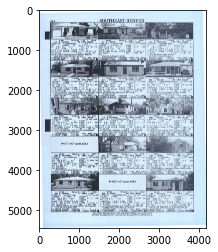

In [70]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

img_rgb = cv2.imread('/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg')
img = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

th = cv2.adaptiveThreshold(img,255, cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,3)

ctrs, _ = cv2.findContours(img,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
im_h, im_w = img.shape
im_area = im_w * im_h
for ctr in ctrs:
    x, y, w, h = cv2.boundingRect(ctr)
    # Filter contours based on size
    if 0.01 * im_area < w * h < 0.1*im_area:
        cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (0, 255, 0), 2)

plt.imshow(img_rgb, cmap='gray', vmin=0, vmax=255)

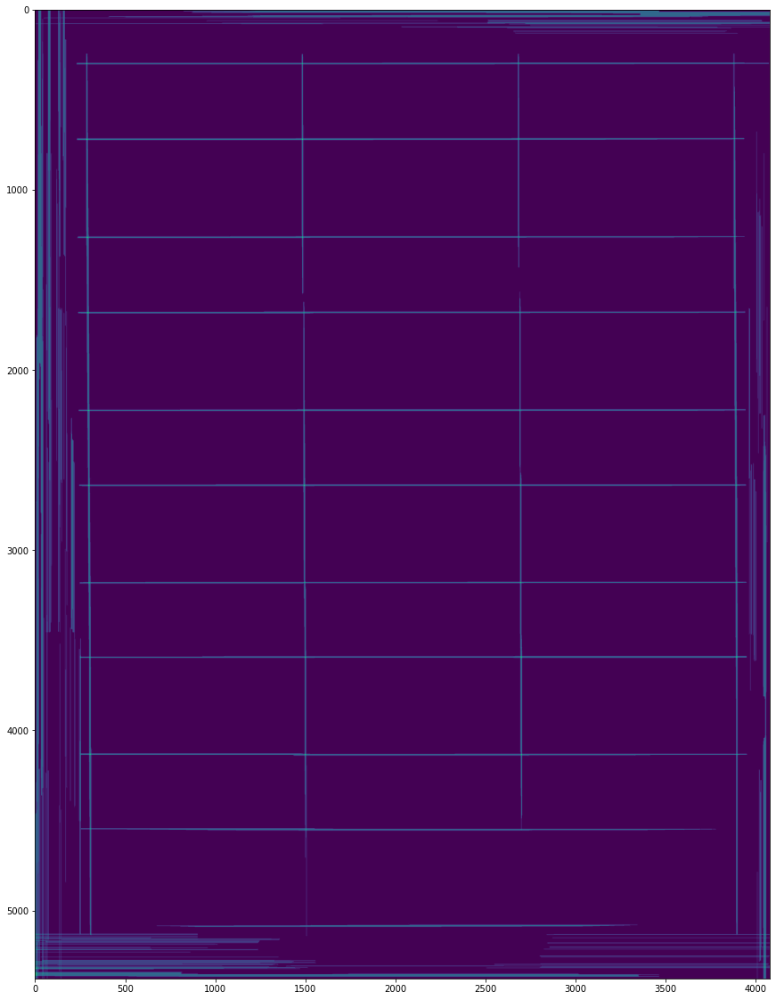

In [99]:
image = cv2.imread('mask.jpeg',0)
plt.figure(figsize=(20,20))
plt.imshow(image)

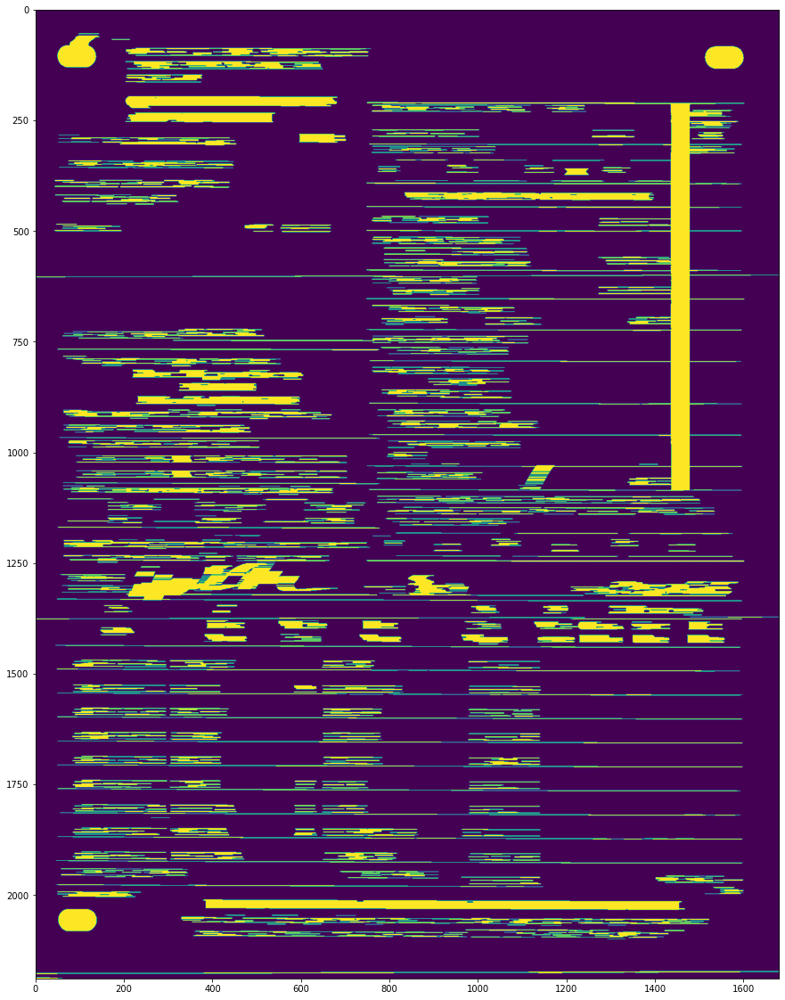

In [80]:
image = cv2.imread('/home/vimalkumar.s/Documents/wages report/0187307000.jpeg')
(hei,wid,_) = image.shape 
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
#Create box-list
box = []
# Get position (x,y), width and height for every contour 
for c in contours:
    x, y, w, h = cv2.boundingRect(c)
    box.append([x,y,w,h])
    
#Create separate lists for all values
heights=[]
widths=[]
xs=[]
ys=[]
#Store values in lists
for b in box:
    heights.append(b[3])
    widths.append(b[2])
    xs.append(b[0])
    ys.append(b[1])
#Retrieve minimum and maximum of lists
min_height = np.min(heights)
min_width = np.min(widths)
min_x = np.min(xs)
min_y = np.min(ys)
max_y = np.max(ys)
max_x = np.max(xs)

#Retrieve height where y is maximum (edge at bottom, last row of table)
for b in box:
    if b[1] == max_y:
        max_y_height = b[3]
#Retrieve width where x is maximum (rightmost edge, last column of table)
for b in box:
    if b[0] == max_x:
        max_x_width = b[2]
# Obtain horizontal lines mask
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,1))
horizontal_mask = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)
horizontal_mask = cv2.dilate(horizontal_mask, horizontal_kernel, iterations=9)
plt.figure(figsize=(20,20))
plt.imshow(horizontal_mask)



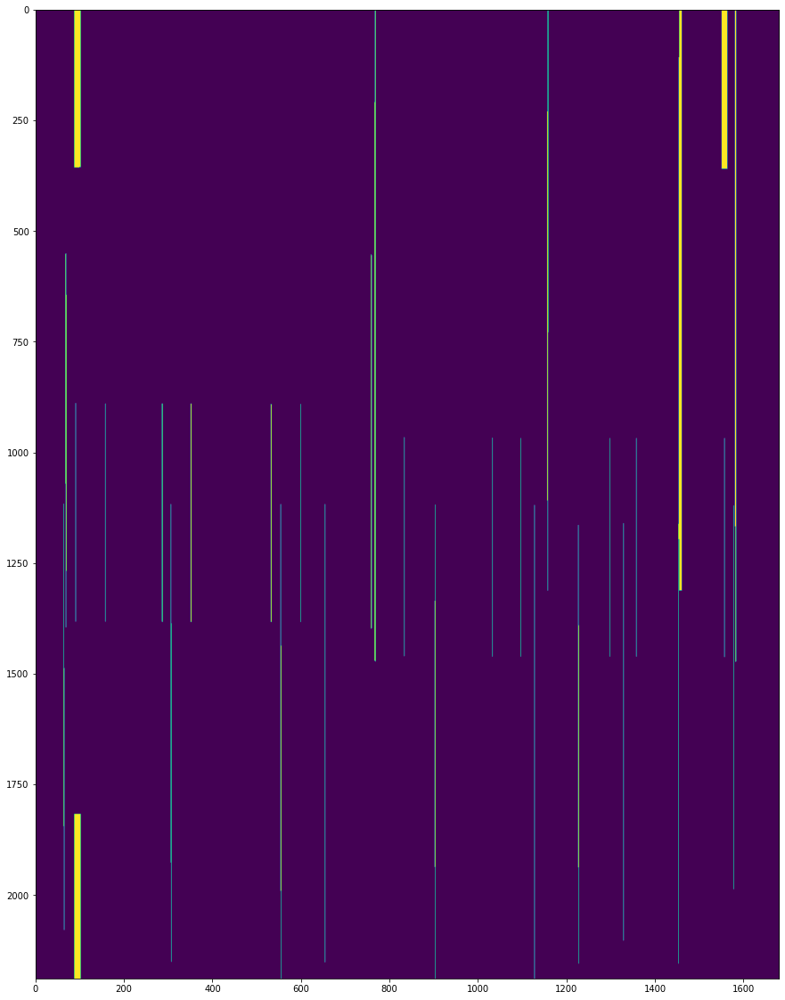

In [81]:
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,50))
vertical_mask = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, vertical_kernel, iterations=1)
vertical_mask= cv2.dilate(vertical_mask, vertical_kernel, iterations=9)


plt.figure(figsize=(20,20))
plt.imshow(vertical_mask)

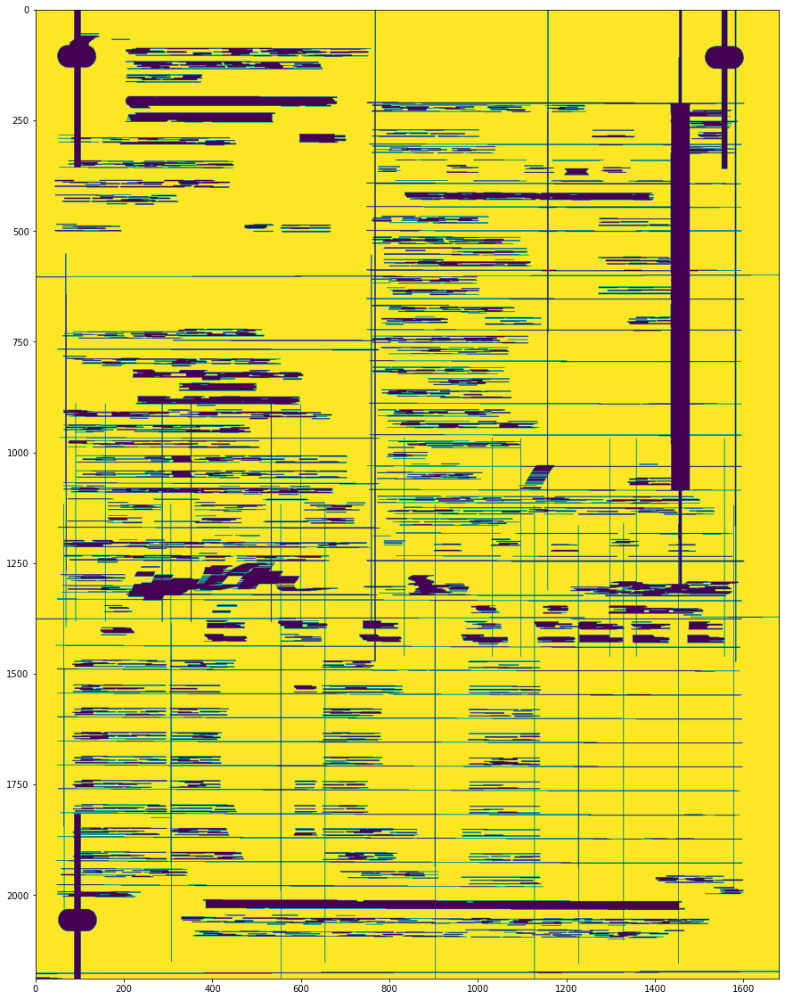

In [82]:
result = 255 - cv2.bitwise_or(vertical_mask, horizontal_mask)
plt.figure(figsize=(20,20))
plt.imshow(result)

In [83]:
#Cropping the image to the table size
crop_img = result[(min_y+5):(max_y+max_y_height), (min_x):(max_x+max_x_width+5)]
#Creating a new image and filling it with white background
img_white = np.zeros((hei, wid), np.uint8)
img_white[:, 0:wid] = (255)
#Retrieve the coordinates of the center of the image
x_offset = int((wid - crop_img.shape[1])/2)
y_offset = int((hei - crop_img.shape[0])/2)
#Placing the cropped and repaired table into the white background
img_white[ y_offset:y_offset+crop_img.shape[0], x_offset:x_offset+crop_img.shape[1]] = crop_img

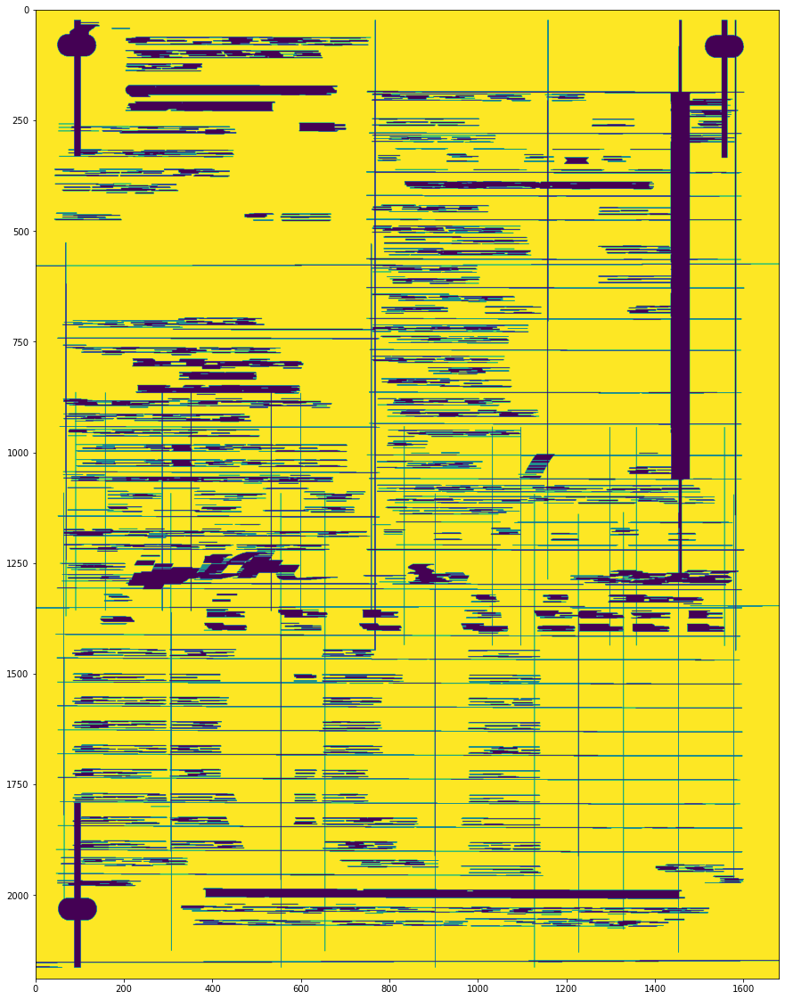

In [84]:
plt.figure(figsize=(20,20))
plt.imshow(img_white)

In [98]:
image_src = '/home/vimalkumar.s/Documents/python_new/Table splitting/mask.jpeg'
img = cv2.imread(image_src)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh1 = cv2.threshold(gray,127,255,cv2.THRESH_BINARY)

edges = cv2.Canny(thresh1,50,150,apertureSize = 3)

minLineLength = 100
maxLineGap = 10
lines = cv2.HoughLinesP(edges,1,np.pi/180,10,minLineLength,maxLineGap)
print(len(lines))
for line in lines:
    cv2.line(img,(line[0][0],line[0][1]),(line[0][2],line[0][3]),(0,0,255),6)
    
plt.figure(figsize=(15,15))
plt.imshow(img)
print(type(img))

TypeError: object of type 'NoneType' has no len()

In [11]:
def pre_process(file):
    im = cv2.imread(file,0)
    pre = cv2.threshold(im, 250, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    ada=cv2.adaptiveThreshold(pre, 255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 21, 10)
    cont= contours, hierarchy = cv2.findContours(ada, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    boxes = []
    for contour in contours:
        box = cv2.boundingRect(cont)
        h = box[3]

 

        if min_text_height_limit < h < max_text_height_limit:
            boxes.append(box)

 

    return boxes

In [12]:
file = '/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg'
pre_process(file)

error: OpenCV(4.5.2) :-1: error: (-5:Bad argument) in function 'boundingRect'
> Overload resolution failed:
>  - array is not a numerical tuple
>  - Expected Ptr<cv::UMat> for argument 'array'


In [23]:
import os
import cv2
import imutils

# This only works if there's only one table on a page
# Important parameters:
#  - morph_size
#  - min_text_height_limit
#  - max_text_height_limit
#  - cell_threshold
#  - min_columns


def pre_process_image(img, save_in_file, morph_size=(8, 8)):

    # get rid of the color
    pre = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Otsu threshold
    pre = cv2.threshold(pre, 250, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    # dilate the text to make it solid spot
    cpy = pre.copy()
    struct = cv2.getStructuringElement(cv2.MORPH_RECT, morph_size)
    cpy = cv2.dilate(~cpy, struct, anchor=(-1, -1), iterations=1)
    pre = ~cpy

    if save_in_file is not None:
        cv2.imwrite(save_in_file, pre)
    return pre


def find_text_boxes(pre, min_text_height_limit=60, max_text_height_limit=150):
    # Looking for the text spots contours
    # OpenCV 3
    # img, contours, hierarchy = cv2.findContours(pre, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    # OpenCV 4
    contours, hierarchy = cv2.findContours(pre, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Getting the texts bounding boxes based on the text size assumptions
    boxes = []
    for contour in contours:
        box = cv2.boundingRect(contour)
        h = box[3]

        if min_text_height_limit < h < max_text_height_limit:
            boxes.append(box)

    return boxes


def find_table_in_boxes(boxes, cell_threshold=10, min_columns=3):
    rows = {}
    cols = {}

    # Clustering the bounding boxes by their positions
    for box in boxes:
        (x, y, w, h) = box
        col_key = x // cell_threshold
        row_key = y // cell_threshold
        cols[row_key] = [box] if col_key not in cols else cols[col_key] + [box]
        rows[row_key] = [box] if row_key not in rows else rows[row_key] + [box]

    # Filtering out the clusters having less than 2 cols
    table_cells = list(filter(lambda r: len(r) >= min_columns, rows.values()))
    # Sorting the row cells by x coord
    table_cells = [list(sorted(tb)) for tb in table_cells]
    # Sorting rows by the y coord
    table_cells = list(sorted(table_cells, key=lambda r: r[0][1]))

    return table_cells


def build_lines(table_cells):
    if table_cells is None or len(table_cells) <= 0:
        return [], []

    max_last_col_width_row = max(table_cells, key=lambda b: b[-1][2])
    max_x = max_last_col_width_row[-1][0] + max_last_col_width_row[-1][2]

    max_last_row_height_box = max(table_cells[-1], key=lambda b: b[3])
    max_y = max_last_row_height_box[1] + max_last_row_height_box[3]

    hor_lines = []
    ver_lines = []

    for box in table_cells:
        x = box[0][0]
        y = box[0][1]
        hor_lines.append((x, y, max_x, y))

    for box in table_cells[0]:
        x = box[0]
        y = box[1]
        ver_lines.append((x, y, x, max_y))

    (x, y, w, h) = table_cells[0][-1]
    ver_lines.append((max_x, y, max_x, max_y))
    (x, y, w, h) = table_cells[0][0]
    hor_lines.append((x, max_y, max_x, max_y))

    return hor_lines, ver_lines


if __name__ == "__main__":
    in_file = os.path.join("/home/vimalkumar.s/Documents/table splitting/page_2/file", "pg_2.jpeg")
    pre_file = os.path.join("/home/vimalkumar.s/Documents/table splitting/page_2/file", "pg_2.jpeg")
    out_file = os.path.join("/home/vimalkumar.s/Documents/table splitting/page_2/file", "pg_2.jpeg")

    img = cv2.imread(os.path.join(in_file))

    pre_processed = pre_process_image(img, pre_file)
    text_boxes = find_text_boxes(pre_processed)
    cells = find_table_in_boxes(text_boxes)
    hor_lines, ver_lines = build_lines(cells)

    # Visualize the result
    vis = img.copy()

    # for box in text_boxes:
    #     (x, y, w, h) = box
    #     cv2.rectangle(vis, (x, y), (x + w - 2, y + h - 2), (0, 255, 0), 1)

    for line in hor_lines:
        [x1, y1, x2, y2] = line
        cv2.line(vis, (x1, y1), (x2, y2), (0, 0, 255), 1)

    for line in ver_lines:
        [x1, y1, x2, y2] = line
        cv2.line(vis, (x1, y1), (x2, y2), (0, 0, 255), 1)

    cv2.imwrite(out_file, vis)

In [39]:
import cv2
import numpy as np

#======================= sort_contours ===========================================
def sort_contours(cnts, method="left-to-right"):
        # initialize the reverse flag and sort index
        reverse = False
        i = 0

        # handle if we need to sort in reverse
        if method == "right-to-left" or method == "bottom-to-top":
                reverse = True

        # handle if we are sorting against the y-coordinate rather than
        # the x-coordinate of the bounding box
        if method == "top-to-bottom" or method == "bottom-to-top":
                i = 1

        # construct the list of bounding boxes and sort them from top to
        # bottom
        boundingBoxes = [cv2.boundingRect(c) for c in cnts]
        (cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes),
                key=lambda b:b[1][i], reverse=reverse))

        # return the list of sorted contours and bounding boxes
        return (cnts, boundingBoxes)
def box_extraction(img_for_box_extraction_path,cropped_dir_path):
        img = cv2.imread(img_for_box_extraction_path, 0)# Read the image
        (thresh, img_bin) = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)#Thresholding the image
        img_bin = 255-img_bin# Invert the image
        #cv2.imwrite("inter_processing/Image_bin.jpg",img_bin)

        # Defining a kernel length
        kernel_length = np.array(img).shape[1]//40

        # A verticle kernel of (1 X kernel_length), which will detect all the verticle lines from the image.
        verticle_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kernel_length))

        # A horizontal kernel of (kernel_length X 1), which will help to detect all the horizontal line from the image.
        hori_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_length, 1))

        # A kernel of (3 X 3) ones.
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

        # Morphological operation to detect verticle lines from an image
        img_temp1 = cv2.erode(img_bin, verticle_kernel, iterations=3)
        verticle_lines_img = cv2.dilate(img_temp1, verticle_kernel, iterations=3)
        #cv2.imwrite("inter_processing/verticle_lines.jpg",verticle_lines_img)

        # Morphological operation to detect horizontal lines from an image
        img_temp2 = cv2.erode(img_bin, hori_kernel, iterations=3)
        horizontal_lines_img = cv2.dilate(img_temp2, hori_kernel, iterations=3)
        #cv2.imwrite("inter_processing/horizontal_lines.jpg",horizontal_lines_img)

        # Weighting parameters, this will decide the quantity of an image to be added to make a new image.
        alpha = 0.5
        beta = 1.0 - alpha

        # This function helps to add two image with specific weight parameter to get a third image as summation of two image.
        img_final_bin = cv2.addWeighted(verticle_lines_img, alpha, horizontal_lines_img, beta, 0.0)
        img_final_bin = cv2.erode(~img_final_bin, kernel, iterations=2)
        plt.figure(figsize=(15,15))
        plt.imshow(img_final_bin)
        (thresh, img_final_bin) = cv2.threshold(img_final_bin, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

        # For Debugging
        # Enable this line to see verticle and horizontal lines in the image which is used to find boxes
        #cv2.imwrite("inter_processing/img_final_bin.jpg",img_final_bin)

        # Find contours for image, which will detect all the boxes
        contours, hierarchy = cv2.findContours(img_final_bin, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # Sort all the contours by top to bottom.
        (contours, boundingBoxes) = sort_contours(contours, method="top-to-bottom")
        idx = 0
        for c in contours:
                # Returns the location and width,height for every contour
                x, y, w, h = cv2.boundingRect(c)

                # If the box height is greater then 20, widht is >80, then only save it as a box in "cropped/" folder.
                if (w > 80 and h > 20) and w > 3*h:
                        idx += 1
                        new_img = img[y:y+h, x:x+w]
                        cv2.imwrite(cropped_dir_path+str(idx) + '.png', new_img)

In [45]:
import cv

ModuleNotFoundError: No module named 'cv'

In [47]:
gray = cv2.imread('mask.jpeg',-1)
#backtorgb = cv2.cvtColor(gray,cv2.COLOR_GRAY2RGB)
#color_img = cv2.cvtColor(gray, cv.CV_GRAY2RGB)
rgb_image = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB) * 255


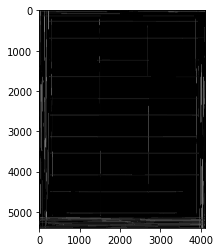

In [50]:
plt.imshow(rgb_image)

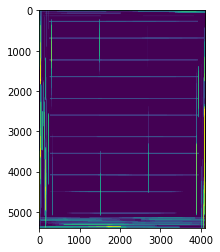

In [53]:
from PIL import Image
x = Image.open('mask.jpeg')
plt.imshow(x)
x.save('mask2.jpeg')

In [52]:
type(x)

PIL.JpegImagePlugin.JpegImageFile

In [77]:
import cv2
import numpy as np
img = cv2.imread("/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 75, 150)
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 30, maxLineGap=250)
for line in lines:
   x1, y1, x2, y2 = line[0]
   cv2.line(img, (x1, y1), (x2, y2), (0, 0, 128), 1)

In [87]:
img = cv2.imread('/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg')
imgray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,dst = cv2.threshold(imgray,127,255,0)
im2,cnts, hierarchy =cv2.findContours(dst,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
rows,cols = img.shape[:2]
[vx,vy,x,y] = cv2.fitLine(cnts[0], cv2.DIST_L2,0,0.01,0.01)
lefty = int((-x*vy/vx) + y)
righty = int(((cols-x)*vy/vx)+y)
cv2.line(img,(cols-1,righty),(0,lefty),(0,255,0),2)
print (img.shape[:2])

ValueError: not enough values to unpack (expected 4, got 2)

In [29]:
import numpy as np
import cv2 as cv

src = cv.imread("/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg", cv.IMREAD_COLOR)

if len(src.shape) != 2:
    gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
else:
    gray = src

gray = cv.bitwise_not(gray)
bw = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 15, -2)

horizontal = np.copy(bw)
vertical = np.copy(bw)

cols = horizontal.shape[1]
horizontal_size = int(cols / 30)

horizontalStructure = cv.getStructuringElement(cv.MORPH_RECT, (horizontal_size, 1))
horizontal = cv.erode(horizontal, horizontalStructure)
horizontal = cv.dilate(horizontal, horizontalStructure)

#np.set_printoptions(threshold=np.inf)
#cv.imwrite("img_horizontal8.png", horizontal)

h_transpose = np.transpose(np.nonzero(horizontal))
print("h_transpose")
print(h_transpose[:100])
#prints [ 56  35] ... [ 56  134]
#and that makes sense, there is an horizontal line more or less in the height 56 like that on the image img_horizontal8.png



rows = vertical.shape[0]
verticalsize = int(rows / 30)
verticalStructure = cv.getStructuringElement(cv.MORPH_RECT, (1, verticalsize))
vertical = cv.erode(vertical, verticalStructure)
vertical = cv.dilate(vertical, verticalStructure)

#cv.imwrite("img_vertical8.png", vertical)

v_transpose = np.transpose(np.nonzero(vertical))

print("v_transpose")
print(v_transpose[:100])

h_transpose
[[  12 3639]
 [  12 3640]
 [  12 3641]
 [  12 3642]
 [  12 3643]
 [  12 3644]
 [  12 3645]
 [  12 3646]
 [  12 3647]
 [  12 3648]
 [  12 3649]
 [  12 3650]
 [  12 3651]
 [  12 3652]
 [  12 3653]
 [  12 3654]
 [  12 3655]
 [  12 3656]
 [  12 3657]
 [  12 3658]
 [  12 3659]
 [  12 3660]
 [  12 3661]
 [  12 3662]
 [  12 3663]
 [  12 3664]
 [  12 3665]
 [  12 3666]
 [  12 3667]
 [  12 3668]
 [  12 3669]
 [  12 3670]
 [  12 3671]
 [  12 3672]
 [  12 3673]
 [  12 3674]
 [  12 3675]
 [  12 3676]
 [  12 3677]
 [  12 3678]
 [  12 3679]
 [  12 3680]
 [  12 3681]
 [  12 3682]
 [  12 3683]
 [  12 3684]
 [  12 3685]
 [  12 3686]
 [  12 3687]
 [  12 3688]
 [  12 3689]
 [  12 3690]
 [  12 3691]
 [  12 3692]
 [  12 3693]
 [  12 3694]
 [  12 3695]
 [  12 3696]
 [  12 3697]
 [  12 3698]
 [  12 3699]
 [  12 3700]
 [  12 3701]
 [  12 3702]
 [  12 3703]
 [  12 3704]
 [  12 3705]
 [  12 3706]
 [  12 3707]
 [  12 3708]
 [  12 3709]
 [  12 3710]
 [  12 3711]
 [  12 3712]
 [  12 3713]
 [  12 3714]


In [65]:
print(v_transpose)

[[ 309 3839]
 [ 310 3837]
 [ 310 3838]
 ...
 [5378  107]
 [5379  107]
 [5380  107]]


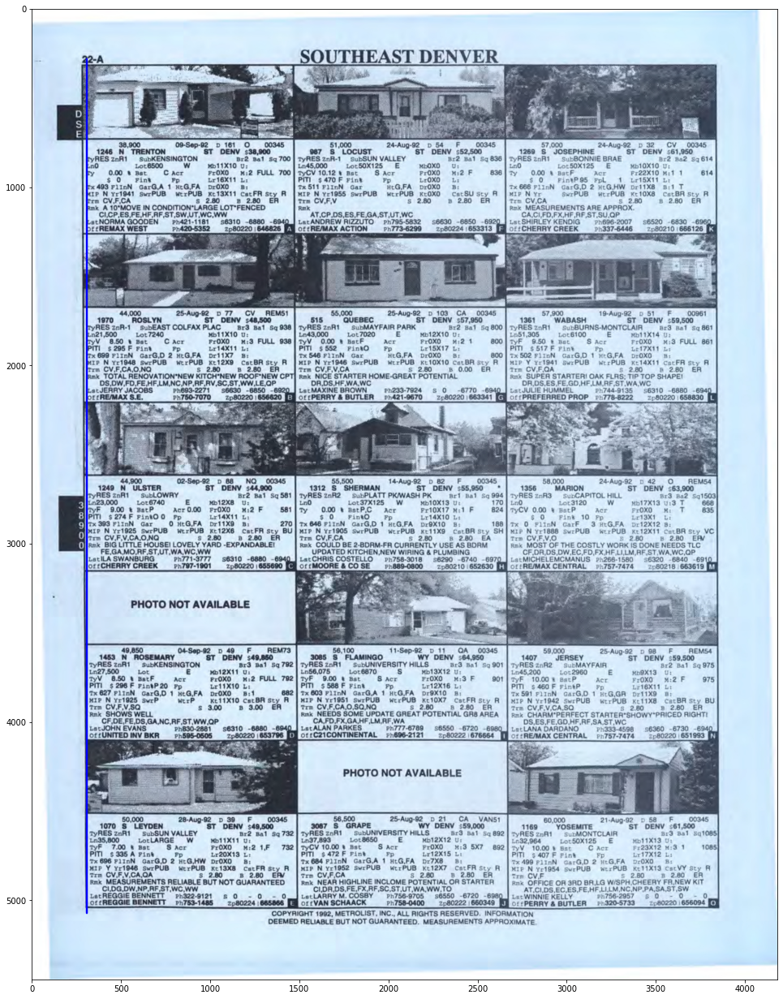

In [66]:

#whiteblankimage = 255 * np.ones(shape=[512, 512, 3], dtype=np.uint8)


cv2.line(image, pt1=(309,280), pt2=(309,(5380-309)), color=(0,0,255), thickness=10)

plt.figure(figsize=(22,22))

plt.imshow(image)

plt.show()

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/home/vimalkumar.s/Documents/table splitting/page_1/file/pg_1.jpeg')

In [12]:
image.shape

(5444, 4182, 3)

In [13]:
cv2.line(image, pt1=(100,300), pt2=(400,300), color=(0,0,255), thickness=10)


array([[[252, 254, 254],
        [252, 254, 254],
        [252, 254, 254],
        ...,
        [251, 255, 255],
        [251, 255, 255],
        [251, 255, 255]],

       [[252, 254, 254],
        [252, 254, 254],
        [252, 254, 254],
        ...,
        [251, 255, 255],
        [251, 255, 255],
        [251, 255, 255]],

       [[252, 254, 254],
        [252, 254, 254],
        [252, 254, 254],
        ...,
        [251, 255, 255],
        [251, 255, 255],
        [251, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 255, 255],
        [253, 255, 255],
        [253, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 255, 255],
        [253, 255, 255],
        [253, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 255, 255],
        [253, 255, 255],
        [253, 255, 255]]

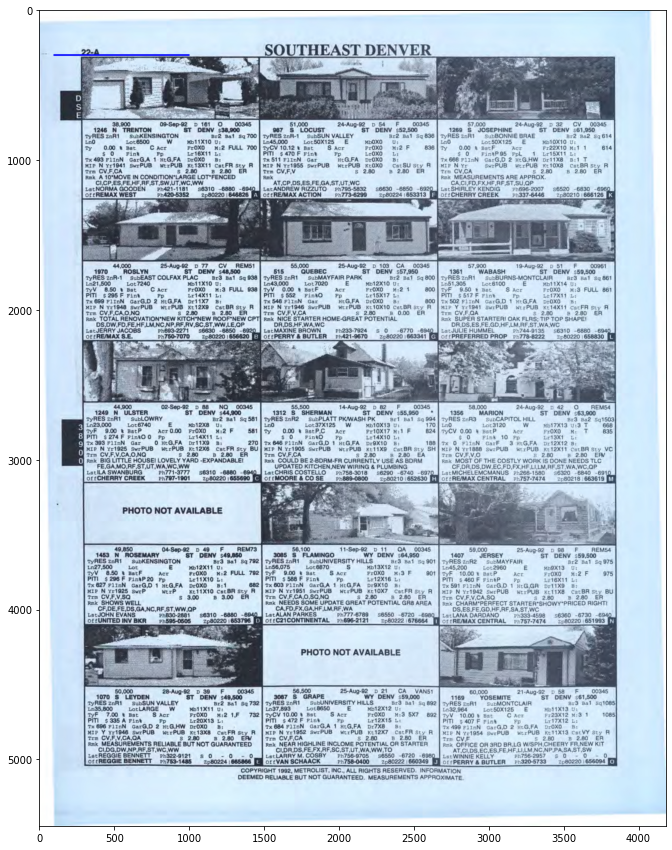

In [16]:

#whiteblankimage = 255 * np.ones(shape=[512, 512, 3], dtype=np.uint8)


cv2.line(image, pt1=(100,300), pt2=(1000,300), color=(0,0,255), thickness=10)

plt.figure(figsize=(15,15))

plt.imshow(image)

plt.show()

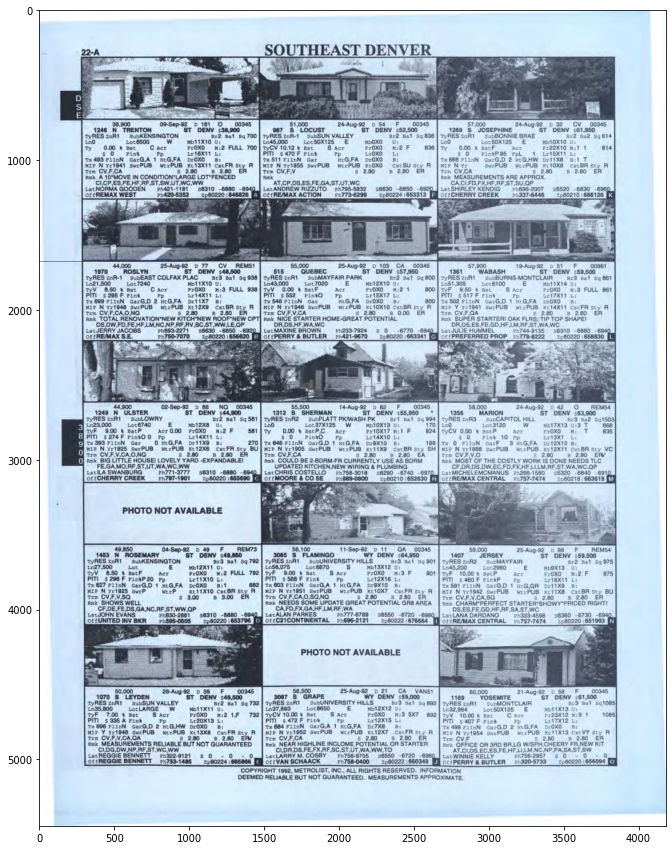

In [5]:
plt.figure(figsize=(15,15))
plt.imshow(img)

In [94]:
import numpy
import cv2

img = cv2.imread('mask_10.jpeg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray,75,150)
lines = cv2.HoughLinesP(edges,1,np.pi/180,50,maxLineGap = 8000)

for line in lines:
    x1,y1,x2,y2 = line[0]
    cv2.line(img,(x1,y1),(x2,y2),(0,255,0),3)

TypeError: 'NoneType' object is not iterable

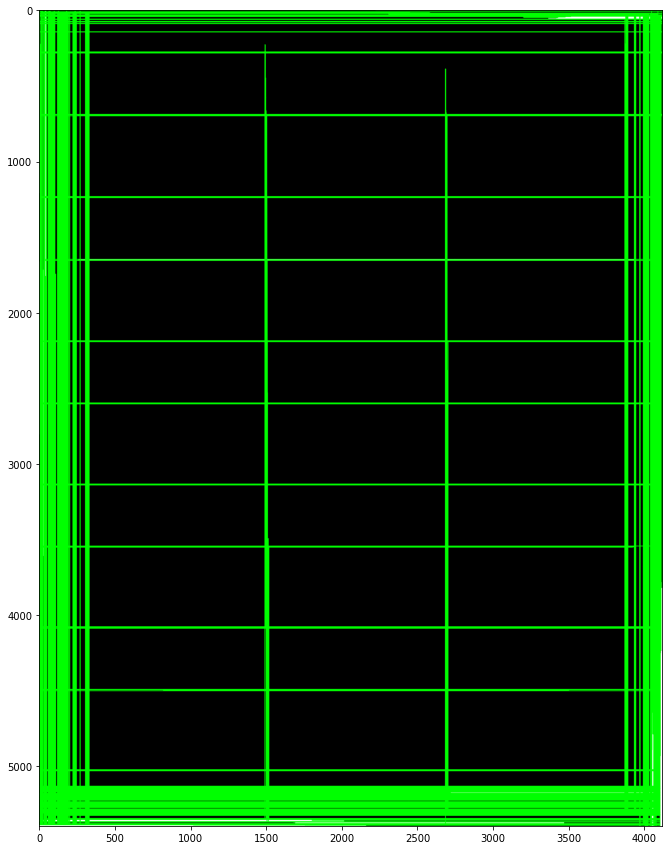

In [90]:
plt.figure(figsize=(15,15))
plt.imshow(img)

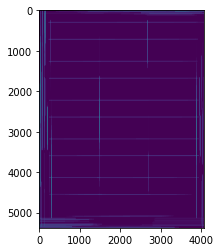

In [93]:
from PIL import Image
x = Image.open('mask10.jpeg')
plt.imshow(x)
x.save('mask_10.jpeg')

In [95]:
import cv2
import numpy as np
from skimage import io              # Only needed for web reading images

# Web read image; use cv2.imread(...) for local images
img = cv2.cvtColor(io.imread('/home/vimalkumar.s/Documents/table splitting/page_4/file/pg_4.jpeg'), cv2.COLOR_RGB2GRAY)

# Get rid of JPG artifacts
img = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)[1]

# Create structuring elements
horizontal_size = 11
vertical_size = 11
horizontalStructure = cv2.getStructuringElement(cv2.MORPH_RECT, (horizontal_size, 1))
verticalStructure = cv2.getStructuringElement(cv2.MORPH_RECT, (1, vertical_size))

# Morphological opening
mask1 = cv2.morphologyEx(img, cv2.MORPH_OPEN, horizontalStructure)
mask2 = cv2.morphologyEx(img, cv2.MORPH_OPEN, verticalStructure)

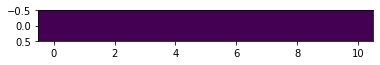

In [97]:
plt.imshow(horizontalStructure)